# RNA Velocity for Macrophages and dendritic cells filtered for mito
## Import seurat loom and velocyto loom
* velocyto was run on BAM file produced by CellRanger Count
* SeuratDisk was used to export Seurat object as loom file

### import libraries

In [1]:
import scanpy as sc
import scvelo as scv
import pandas as pd
import numpy as np

### Set default figure parameters of scVelo

In [2]:
scv.set_figure_params()

In [3]:
adata_rt1 = scv.read("/Users/Oliver.Eichmueller/velocyto_test/rt-1/Output/possorted_genome_bam_X0WAR.loom")
adata_rt2 = scv.read("/Users/Oliver.Eichmueller/velocyto_test/rt-2/Output/possorted_genome_bam_A5Y2F.loom")
adata_rtc41 = scv.read("/Users/Oliver.Eichmueller/velocyto_test/rtc4-1/Output/possorted_genome_bam_FGRIQ.loom")
adata_rtc42 = scv.read("/Users/Oliver.Eichmueller/velocyto_test/rtc4-2/Output/possorted_genome_bam_RP23L.loom")
adata_untr = scv.read("/Users/Oliver.Eichmueller/velocyto_test/untreated/Output/possorted_genome_bam_U5LH0.loom")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
adata_rt1.var_names_make_unique()
adata_rt2.var_names_make_unique()
adata_rtc41.var_names_make_unique()
adata_rtc42.var_names_make_unique()
adata_untr.var_names_make_unique()

In [5]:
scv.utils.clean_obs_names(adata_rt1)
scv.utils.clean_obs_names(adata_rt2)
scv.utils.clean_obs_names(adata_rtc41)
scv.utils.clean_obs_names(adata_rtc42)
scv.utils.clean_obs_names(adata_untr)

In [6]:
adata_rt1.obs.index = adata_rt1.obs.index + '-1_1'
adata_rt2.obs.index = adata_rt2.obs.index + '-1_2'
adata_rtc41.obs.index = adata_rtc41.obs.index + '-1_3'
adata_rtc42.obs.index = adata_rtc42.obs.index + '-1_4'
adata_untr.obs.index = adata_untr.obs.index + '-1_5'

In [7]:
adata_merge = adata_rt1.concatenate(adata_rt2, adata_rtc41, adata_rtc42, adata_untr)

In [8]:
adata_merge.obs

,batch
AAACGCTTCGACACCG-1_1-0,0
AAAGAACTCGATTTCT-1_1-0,0
AAAGTCCAGTTCTCTT-1_1-0,0
AAAGGTAAGCGAGTCA-1_1-0,0
AAACGCTTCTGCACCT-1_1-0,0
...,...
TTTGGTTGTACTCAAC-1_5-4,4
TTTGTTGCAGTGGGTA-1_5-4,4
TTTCGATTCCGGCAAC-1_5-4,4
TTTGGAGGTCGTATTG-1_5-4,4


### Load Loom File from Seurat

In [9]:
se_loom = scv.read("/Users/Oliver.Eichmueller/velocyto_test/seurat_MCells_211028.loom", cache=False)

In [10]:
sceMerge = scv.utils.merge(se_loom, adata_merge)

In [11]:
sceMerge.obs

,UMAP_1,UMAP_2,integrated_snn_res.0.1,integrated_snn_res.0.2,integrated_snn_res.0.3,integrated_snn_res.0.5,nCount_RNA,nFeature_RNA,orig.ident,percent.mt,seurat_clusters,sample_batch,batch,initial_size_spliced,initial_size_unspliced,initial_size
AAACCCAAGGTATTGA,-1.316522,2.045642,1,1,1,1,2908.0,1346,rt-1,3.713893,1,-1_1,0,1995,1911,1995.0
AAACCCAAGTTAACAG,-2.272660,-2.516265,1,2,4,4,9403.0,2467,rt-1,1.286823,4,-1_1,0,7346,2176,7346.0
AAACCCACAATAGAGT,-0.931856,-1.448070,1,1,2,7,6764.0,2277,rt-1,2.188054,7,-1_1,0,4873,3258,4873.0
AAACCCACACAAAGCG,1.818501,2.805137,1,1,2,2,12295.0,2958,rt-1,1.724278,2,-1_1,0,9417,2009,9417.0
AAACCCAGTAACAGTA,-0.925773,2.166750,1,1,1,1,7677.0,2447,rt-1,2.084147,1,-1_1,0,5855,2152,5855.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCACTGGCGT,2.391671,0.522042,1,1,2,2,14293.0,3803,untreated-1,1.854054,2,-1_5,4,10956,2786,10956.0
TTTGTTGCATGACTAC,-2.573850,3.033705,1,1,1,1,1797.0,1029,untreated-1,4.284919,1,-1_5,4,1262,856,1262.0
TTTGTTGTCCCATGGG,-2.783840,-3.013947,1,2,4,4,4901.0,1644,untreated-1,2.183228,4,-1_5,4,3720,1072,3720.0
TTTGTTGTCCTAGCGG,-3.646763,-6.499933,2,4,6,6,7855.0,2330,untreated-1,0.980267,6,-1_5,4,6106,1786,6106.0


In [12]:
sceMerge.obsm['X_umap'] = np.vstack((sceMerge.obs['UMAP_1'].to_numpy(), sceMerge.obs['UMAP_2'].to_numpy())).T

... storing 'orig.ident' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


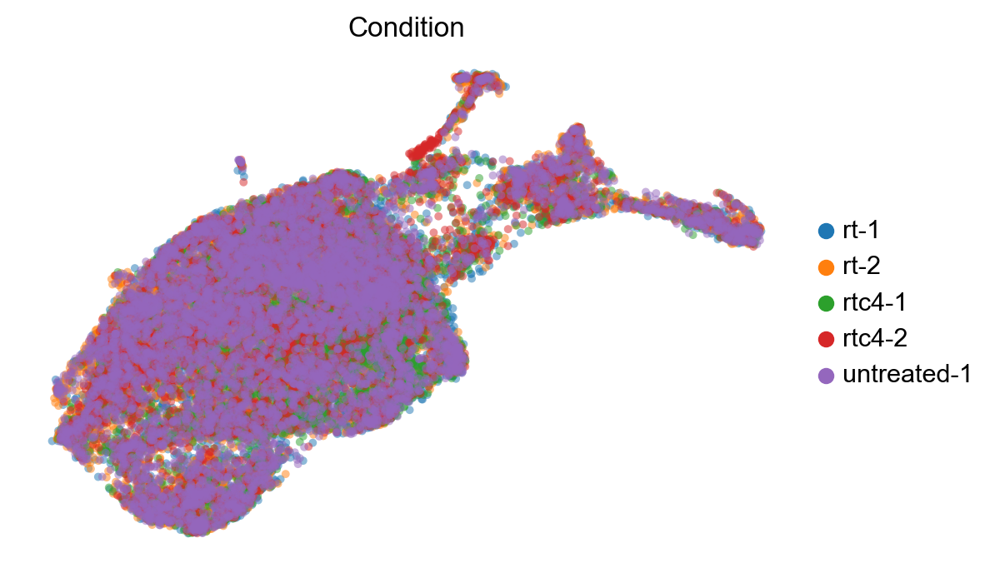

In [13]:
sc.pl.umap(sceMerge, color='orig.ident', frameon=False, legend_loc='right margin', title='Condition',
          alpha=.5,size=50)

### Filter and normalize

In [14]:
scv.pp.filter_genes(sceMerge, min_shared_counts=20)
scv.pp.normalize_per_cell(sceMerge)
scv.pp.filter_genes_dispersion(sceMerge, n_top_genes=2000)
scv.pp.log1p(sceMerge)

Filtered out 291 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.


In [15]:
scv.pp.filter_and_normalize(sceMerge, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(sceMerge, n_pcs=30, n_neighbors=30)

Filtered out 70 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing neighbors
    finished (0:00:14) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


### Compute velocities

In [16]:
scv.tl.velocity(sceMerge)

computing velocities
    finished (0:00:10) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


### Compute velocity graph

In [17]:
scv.tl.velocity_graph(sceMerge)

computing velocity graph (using 1/8 cores)


  0%|          | 0/27865 [00:00<?, ?cells/s]

    finished (0:03:40) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


## Plot velocity stream

computing velocity embedding
    finished (0:00:07) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


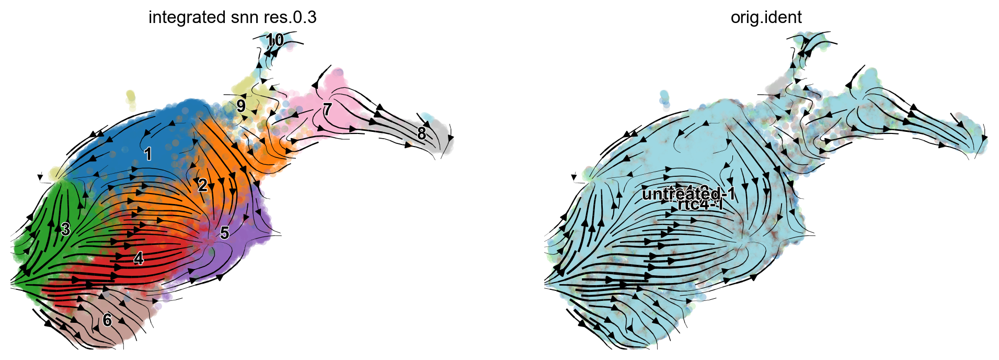

In [18]:
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color=['integrated_snn_res.0.3','orig.ident'], 
                                 palette="tab20")

## Plot individual arrows

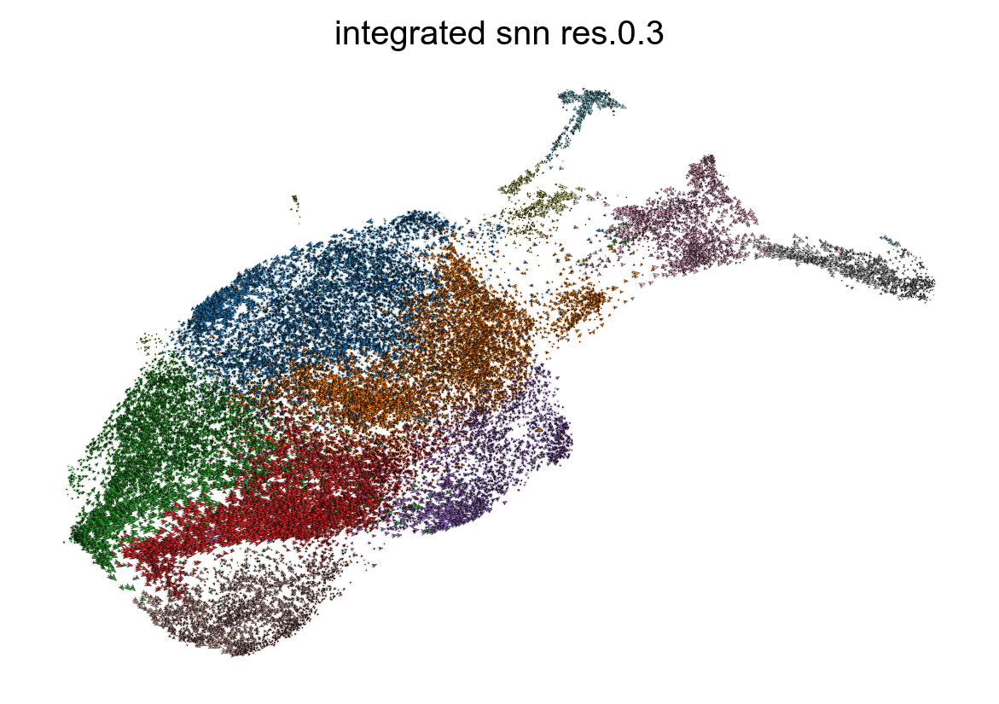

In [19]:
scv.pl.velocity_embedding(sceMerge, arrow_length=5, arrow_size=5, dpi=120, color='integrated_snn_res.0.3')

## Plot grid

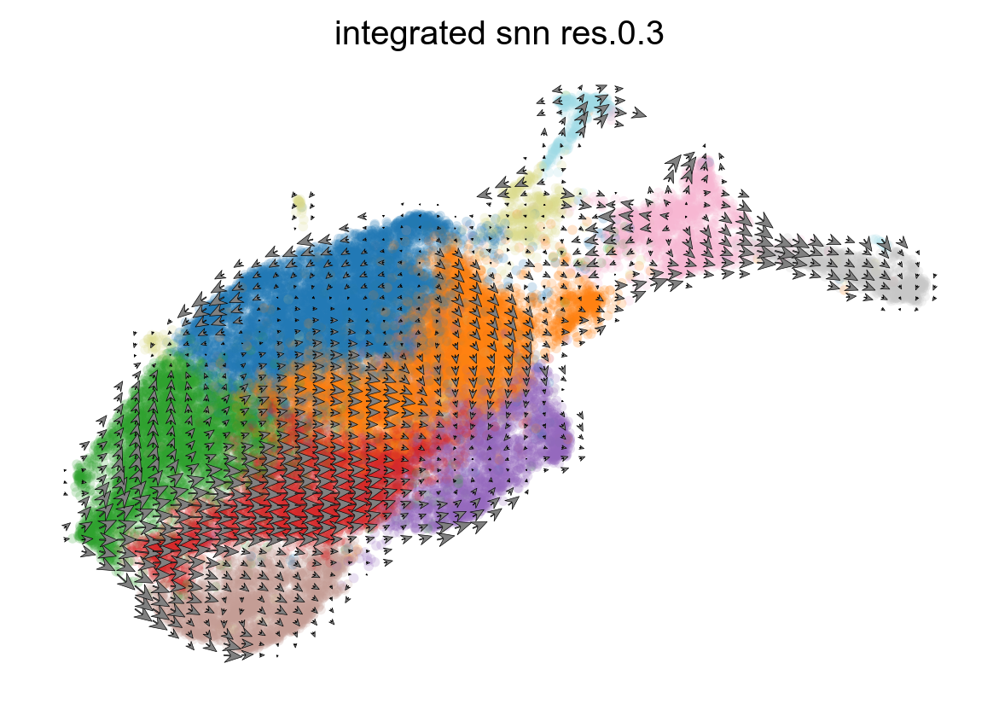

In [20]:
scv.pl.velocity_embedding_grid(sceMerge,arrow_length=3, arrow_size=3, dpi=120, color='integrated_snn_res.0.3')

## Plot velocity confidence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


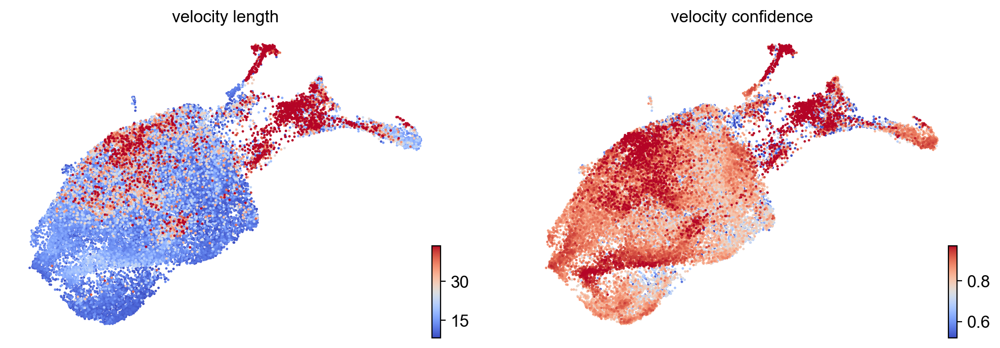

In [21]:
scv.tl.velocity_confidence(sceMerge)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(sceMerge, c=keys, cmap='coolwarm', perc=[5, 95])

### Test differential Kinetics

In [22]:
var_names = ["Mrc1", "H2-Ab1", "Ly6g", "Itgam"]
scv.tl.differential_kinetic_test(sceMerge, var_names=var_names, groupby='integrated_snn_res.0.3')

recovering dynamics (using 1/8 cores)
    finished (0:00:18) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)

outputs model fit of gene: Itgam
testing for differential kinetics
    finished (0:00:02) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)

outputs model fit of gene: Itgam


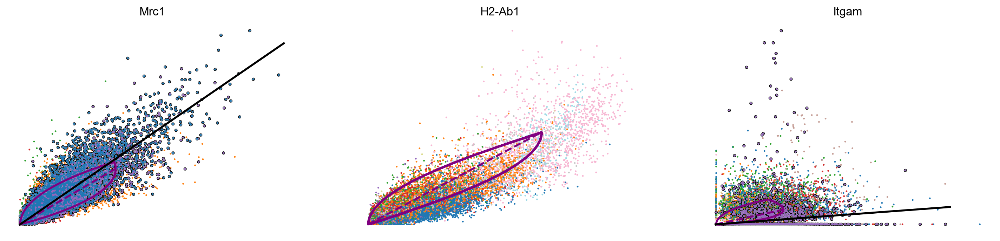

In [23]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(sceMerge, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

In [24]:
top_genes = sceMerge.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(sceMerge, var_names=top_genes, groupby='integrated_snn_res.0.3')

recovering dynamics (using 1/8 cores)


  0%|          | 0/97 [00:00<?, ?gene/s]

    finished (0:03:55) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
testing for differential kinetics
    finished (0:01:17) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


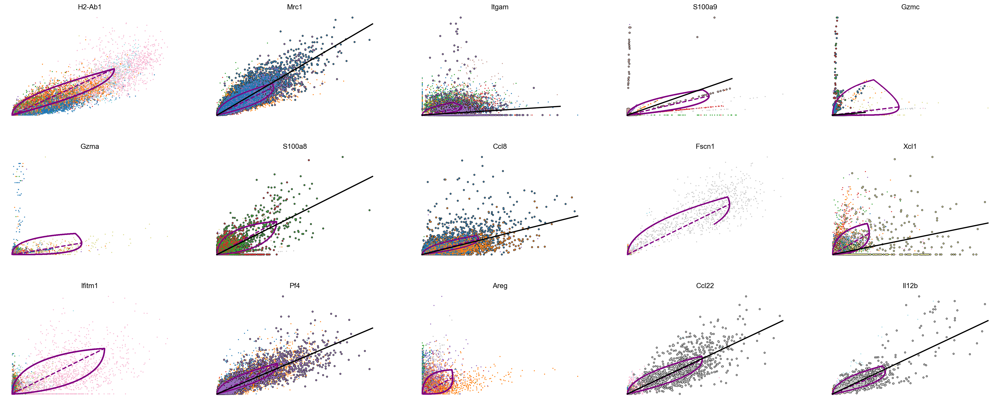

In [25]:
scv.pl.scatter(sceMerge, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', **kwargs)

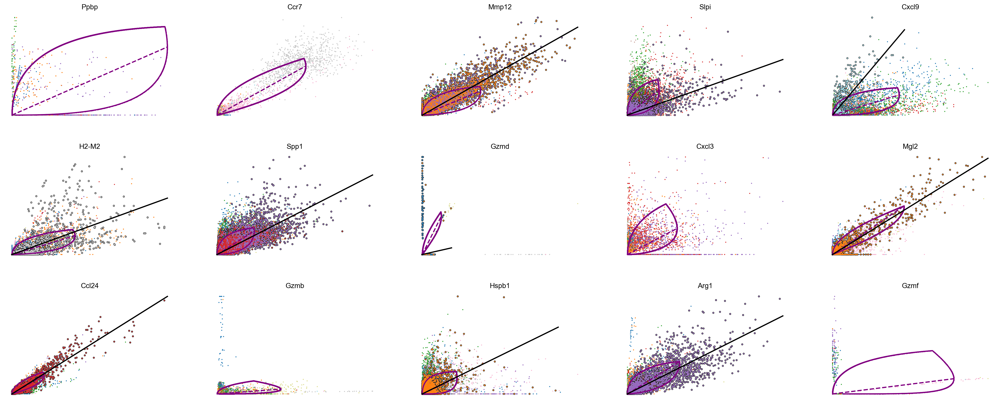

In [26]:
scv.pl.scatter(sceMerge, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', **kwargs)

In [27]:
scv.tl.velocity(sceMerge, diff_kinetics=True)
scv.tl.velocity_graph(sceMerge)

computing velocities
    finished (0:00:11) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/8 cores)


  0%|          | 0/27865 [00:00<?, ?cells/s]

    finished (0:03:29) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


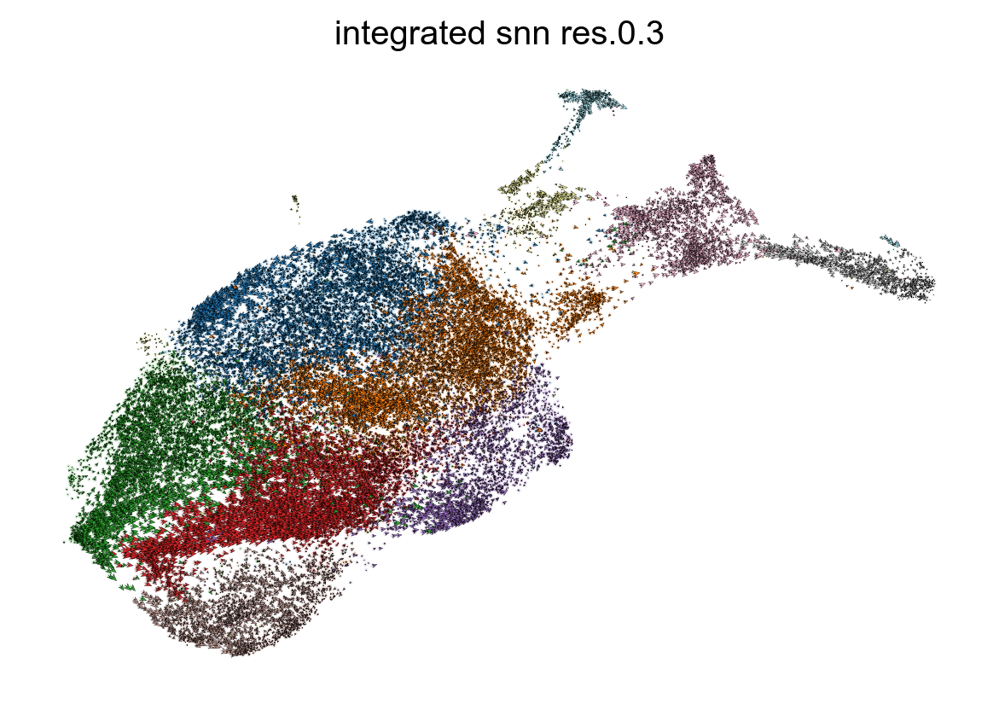

In [28]:
scv.pl.velocity_embedding(sceMerge, arrow_length=5, arrow_size=5, dpi=120, color='integrated_snn_res.0.3')

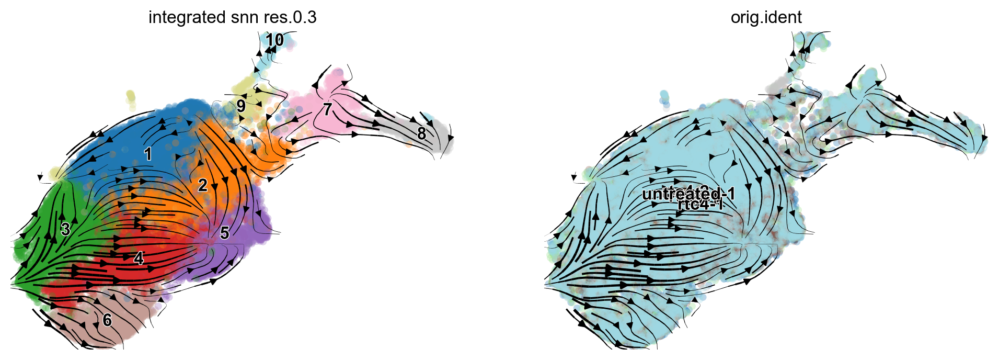

In [29]:
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color=["integrated_snn_res.0.3", "orig.ident"])

saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/MCells_res03_stream.png


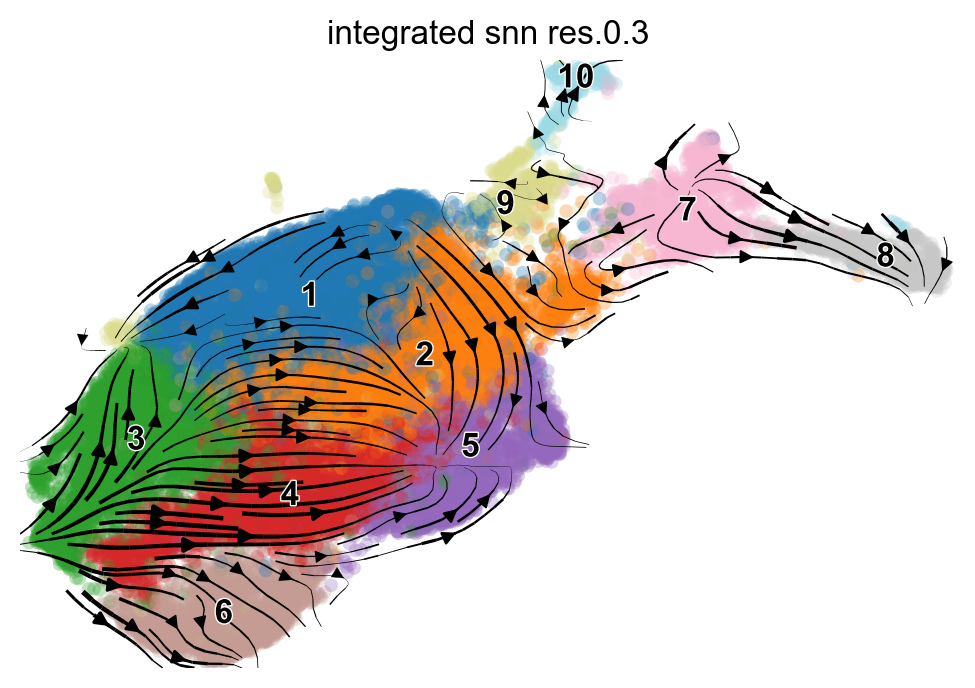

In [30]:
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color=["integrated_snn_res.0.3"],
                                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/MCells_res03_stream.png')

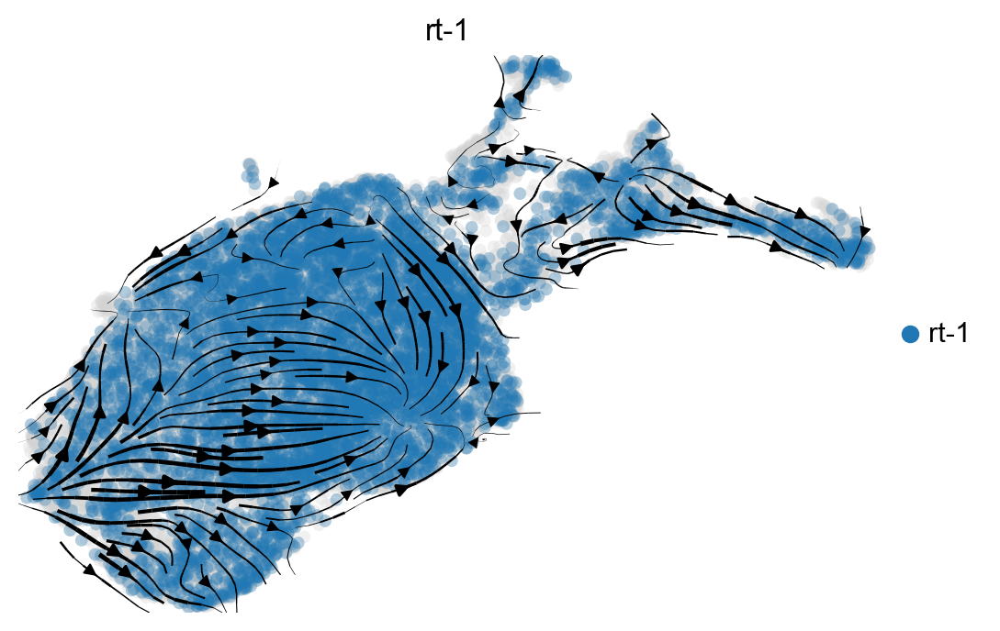

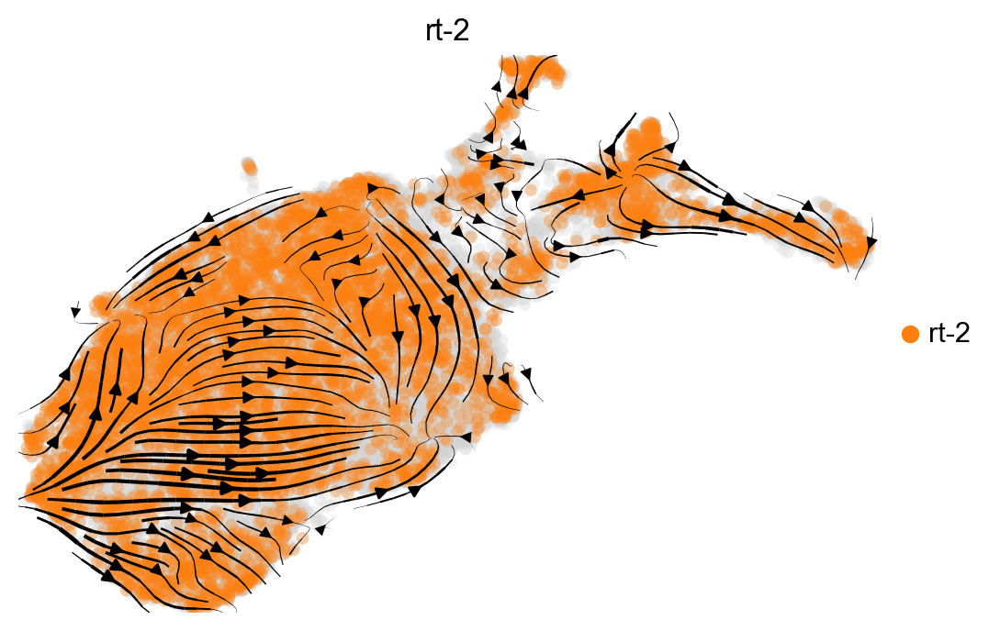

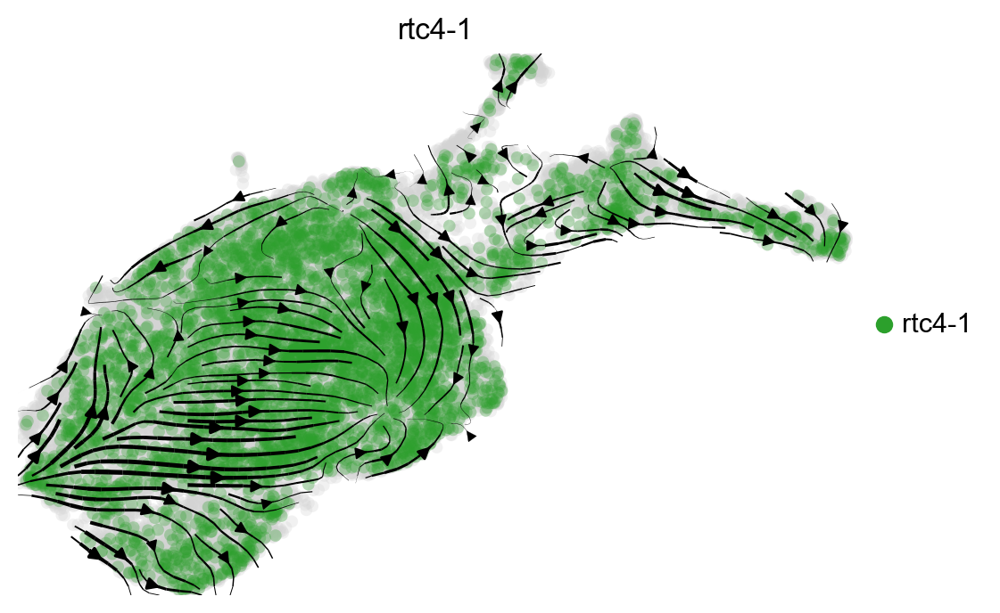

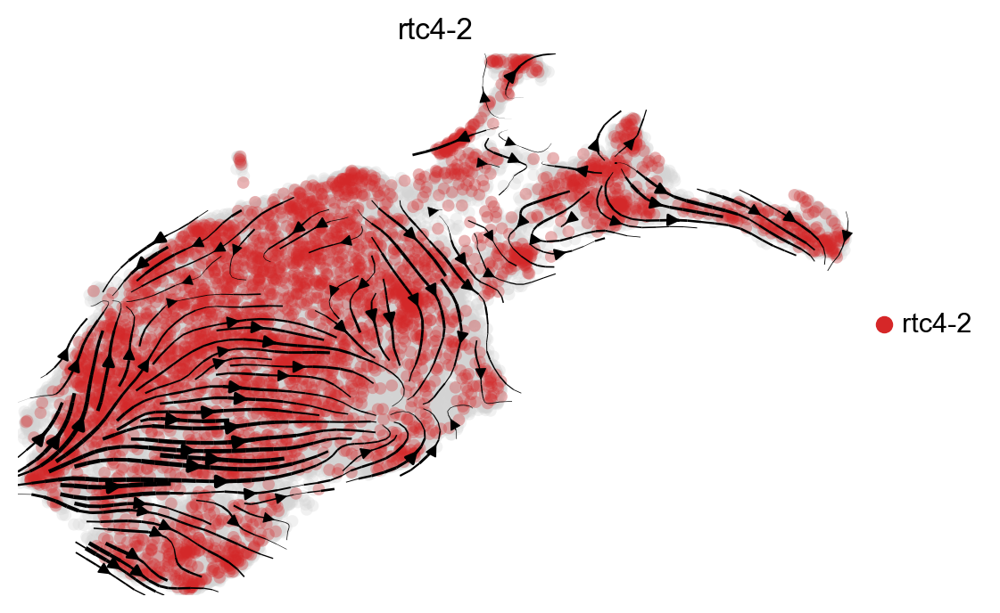

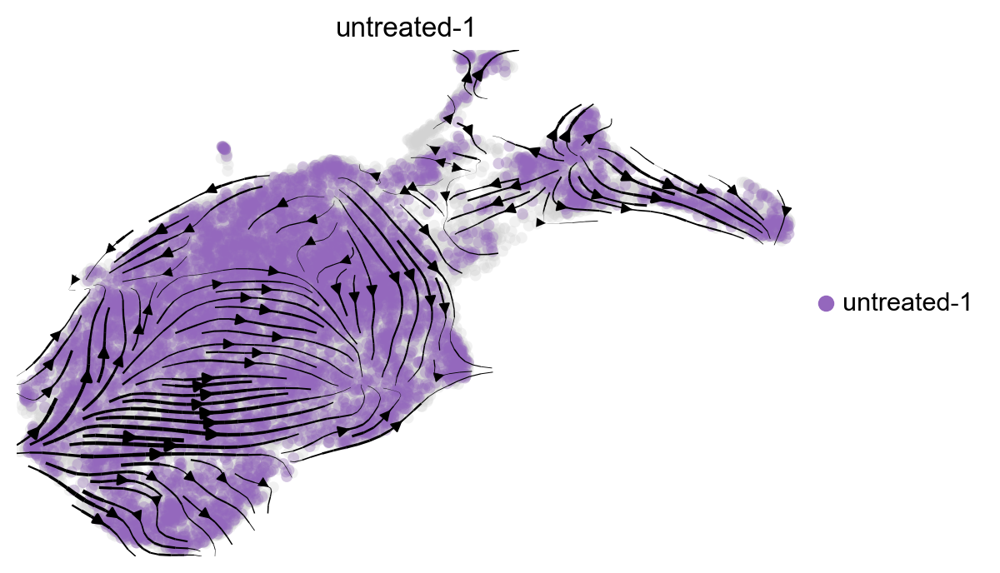

In [31]:
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color='orig.ident', groups='rt-1', legend_loc='right margin'
                                ,palette='top20')
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color='orig.ident', groups='rt-2', legend_loc='right margin'
                                ,palette='top20')
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color='orig.ident', groups='rtc4-1', legend_loc='right margin'
                                ,palette='top20')
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color='orig.ident', groups='rtc4-2', legend_loc='right margin'
                                ,palette='top20')
scv.pl.velocity_embedding_stream(sceMerge, basis='umap', color='orig.ident', groups='untreated-1', legend_loc='right margin'
                                ,palette='top20')

In [32]:
scv.pl.velocity_embedding_stream(sceMerge[(sceMerge.obs['orig.ident']=='rt-1')], basis='umap', 
                                 legend_loc='right margin',
                                 color=['integrated_snn_res.0.3'], size =200, title = 'rt-1', show=False,
                                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt1_res03_stream.png')
scv.pl.velocity_embedding_stream(sceMerge[(sceMerge.obs['orig.ident']=='rt-2')], basis='umap',  
                                 legend_loc='right margin',
                                 color=['integrated_snn_res.0.3'], size =200, title = 'rt-2', show=False,
                                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt2_res03_stream.png')
scv.pl.velocity_embedding_stream(sceMerge[(sceMerge.obs['orig.ident']=='rtc4-1')], basis='umap', 
                                 legend_loc='right margin', 
                                 color=['integrated_snn_res.0.3'], size =200, title = 'rtc4-1', show=False,
                                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt41_res03_stream.png')
scv.pl.velocity_embedding_stream(sceMerge[(sceMerge.obs['orig.ident']=='rtc4-2')], basis='umap', 
                                 legend_loc='right margin', 
                                 color=['integrated_snn_res.0.3'], size =200, title = 'rtc4-2', show=False,
                                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt42_res03_stream.png')
scv.pl.velocity_embedding_stream(sceMerge[(sceMerge.obs['orig.ident']=='untreated-1')], basis='umap',  
                                 legend_loc='right margin',
                                 color=['integrated_snn_res.0.3'], size =200, title = 'untreated', show=False,
                                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_res03_stream.png')

saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt1_res03_stream.png
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt2_res03_stream.png
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt41_res03_stream.png
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt42_res03_stream.png
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_res03_stream.png


<AxesSubplot:title={'center':'untreated'}>

In [60]:
#scv.pl.velocity(sceMerge, ["Retnla", "Mrc1", "Il10", "Apoe", "Areg", "Ptgs2", "Pparg", "Myc", "Nos2", "Ccr7", "Tnf", 
#"Il6", "Inhba", "Il1b", "Il12b", "Cd86", "Slc7a2", "Cxcl9", "Serpinb2", "Cxcl3", "Il1a", "Cd38",     
#"Lcn2", "Ptges", "Cd200", "Traf1", "Arg1", "Fn1", "Egr2", "Mgl2", "Socs2", "Ch25h", "Flt1", 
#"Pdcd1lg2", "Ccl22", "Cdh1", "Ccl17", "Itgb3", "Il4i1", "Slc13a3", "Trp53inp1", "Fcgrt", "Slc40a1", "Cxcl10",
#"Cd274", "Ccl5", "Socs1", "Il12a"], ncols=2)

In [34]:
gene=["Retnla", "Mrc1", "Il10", "Apoe", "Areg", "Ptgs2", "Pparg", "Myc", "Nos2", "Ccr7", "Tnf", 
"Il6", "Inhba", "Il1b", "Il12b", "Cd86", "Slc7a2", "Cxcl9", "Serpinb2", "Cxcl3", "Il1a", "Cd38",     
"Lcn2", "Ptges", "Cd200", "Traf1", "Arg1", "Fn1", "Egr2", "Mgl2", "Socs2", "Ch25h", "Flt1", 
"Pdcd1lg2", "Ccl22", "Cdh1", "Ccl17", "Itgb3", "Il4i1", "Slc13a3", "Trp53inp1", "Fcgrt", "Slc40a1", "Cxcl10",
"Cd274", "Ccl5", "Socs1", "Il12a"]
scv.pl.velocity(sceMerge[(sceMerge.obs['orig.ident']=='rt-1')],gene, ncols=2, size=20, show=False,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-1_M_subtypes.pdf')
scv.pl.velocity(sceMerge[(sceMerge.obs['orig.ident']=='rt-2')],gene, ncols=2, size=20,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-2_M_subtypes.pdf', show=False)
scv.pl.velocity(sceMerge[(sceMerge.obs['orig.ident']=='rtc4-1')],gene, ncols=2, size=20,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc41_M_subtypes.pdf', show=False)
scv.pl.velocity(sceMerge[(sceMerge.obs['orig.ident']=='rtc4-2')],gene, ncols=2, size=20,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc42_M_subtypes.pdf', show=False)
scv.pl.velocity(sceMerge[(sceMerge.obs['orig.ident']=='untreated-1')],gene, ncols=2, size=20,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_M_subtypes.pdf', show=False)

Trying to set attribute `.layers` of view, copying.


saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-1_M_subtypes.pdf


Trying to set attribute `.layers` of view, copying.


saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-2_M_subtypes.pdf


Trying to set attribute `.layers` of view, copying.


saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc41_M_subtypes.pdf


Trying to set attribute `.layers` of view, copying.


saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc42_M_subtypes.pdf


Trying to set attribute `.layers` of view, copying.


saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_M_subtypes.pdf


<AxesSubplot:title={'center':'expression'}>

In [35]:
gene1=["Retnla", "Mrc1", "Il10", "Apoe", "Areg", "Ptgs2", "Pparg", "Myc", "Nos2", "Ccr7", "Tnf", 
"Il6", "Inhba", "Il1b", "Il12b", "Cd86", "Slc7a2", "Cxcl9", "Serpinb2", "Cxcl3", "Il1a", "Cd38",     
"Lcn2", "Ptges", "Cd200", "Traf1", "Arg1", "Fn1", "Egr2", "Mgl2", "Socs2", "Ch25h", "Flt1", 
"Pdcd1lg2", "Ccl22", "Cdh1", "Ccl17", "Itgb3", "Il4i1", "Slc13a3", "Trp53inp1", "Fcgrt", "Slc40a1", "Cxcl10",
"Cd274", "Ccl5", "Socs1", "Il12a"]

scv.pl.velocity(sceMerge,gene, ncols=2, size=20, 
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/all_M_subtypes.pdf', show=False)

saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/all_M_subtypes.pdf


<AxesSubplot:title={'center':'expression'}>

## Estimate Cell states and transitions

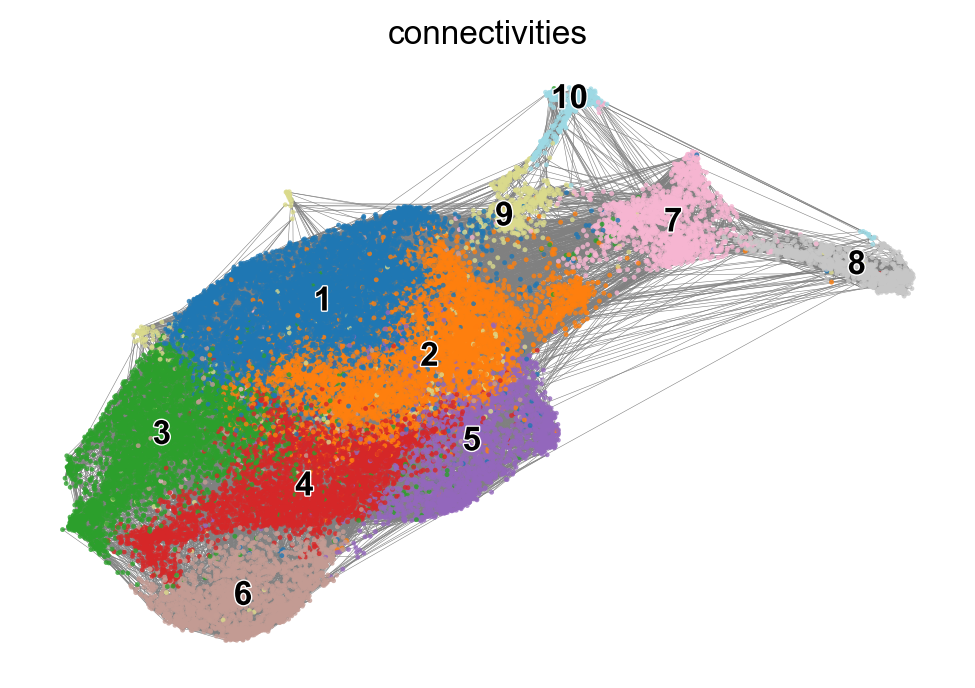

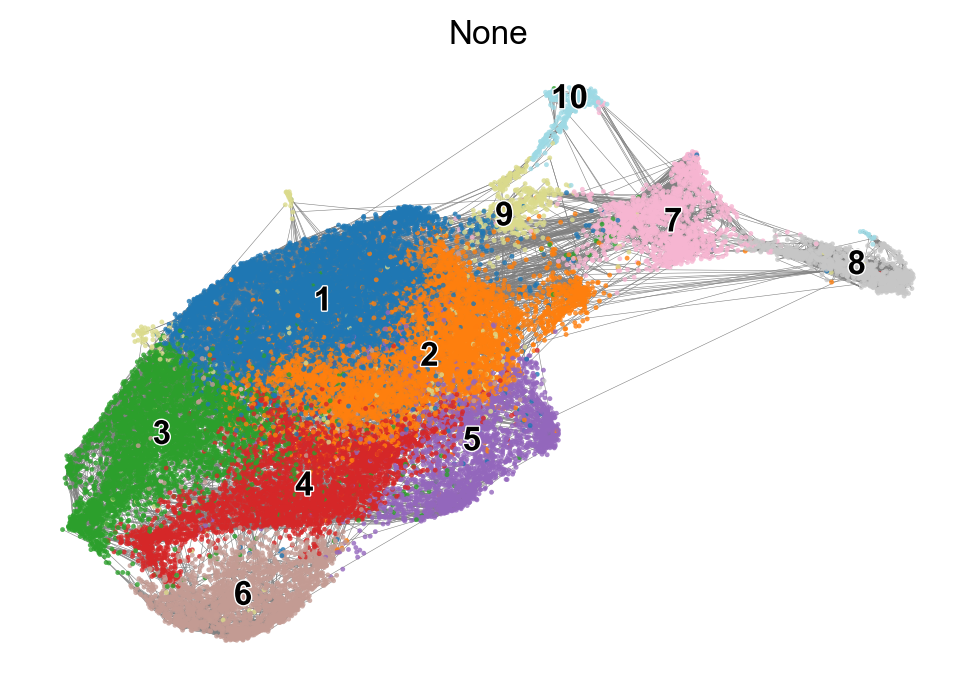

In [36]:
scv.pl.velocity_graph(sceMerge, threshold=.4, color="integrated_snn_res.0.3", which_graph='connectivities')
scv.pl.velocity_graph(sceMerge, threshold=.2, color="integrated_snn_res.0.3", which_graph='None')

In [37]:
scv.pl.velocity_graph(sceMerge, threshold=.1, color="orig.ident", groups="rt-1", show=False,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-1_trans_none.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.1, color="orig.ident", groups="rt-2",show=False,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-2_trans_none.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.1, color="orig.ident", groups="rtc4-1",show=False,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-1_trans_none.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.1, color="orig.ident", groups="rtc4-2",show=False,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-2_trans_none.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.1, color="orig.ident", groups="untreated-1",show=False,
                save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_trans_none.pdf')

saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-1_trans_none.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-2_trans_none.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-1_trans_none.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-2_trans_none.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_trans_none.pdf


<AxesSubplot:title={'center':'untreated-1'}>

In [38]:
scv.pl.velocity_graph(sceMerge, threshold=.25, color="orig.ident", groups="rt-1", which_graph='connectivities',
                     show=False, 
                      save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-1_trans_connectivities.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.25, color="orig.ident", groups="rt-2", which_graph='connectivities',
                     show=False, 
                      save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-2_trans_connectivities.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.25, color="orig.ident", groups="rtc4-1", which_graph='connectivities',
                     show=False, 
                      save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-1_trans_connectivities.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.25, color="orig.ident", groups="rtc4-2", which_graph='connectivities',
                     show=False, 
                      save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-2_trans_connectivities.pdf')
scv.pl.velocity_graph(sceMerge, threshold=.25, color="orig.ident", groups="untreated-1", which_graph='connectivities',
                     show=False, 
                      save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_trans_connectivities.pdf')

saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-1_trans_connectivities.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rt-2_trans_connectivities.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-1_trans_connectivities.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/rtc4-2_trans_connectivities.pdf
saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/untreated_trans_connectivities.pdf


<AxesSubplot:title={'center':'connectivities'}>

computing terminal states
    identified 6 regions of root cells and 1 region of end points .
    finished (0:00:05) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


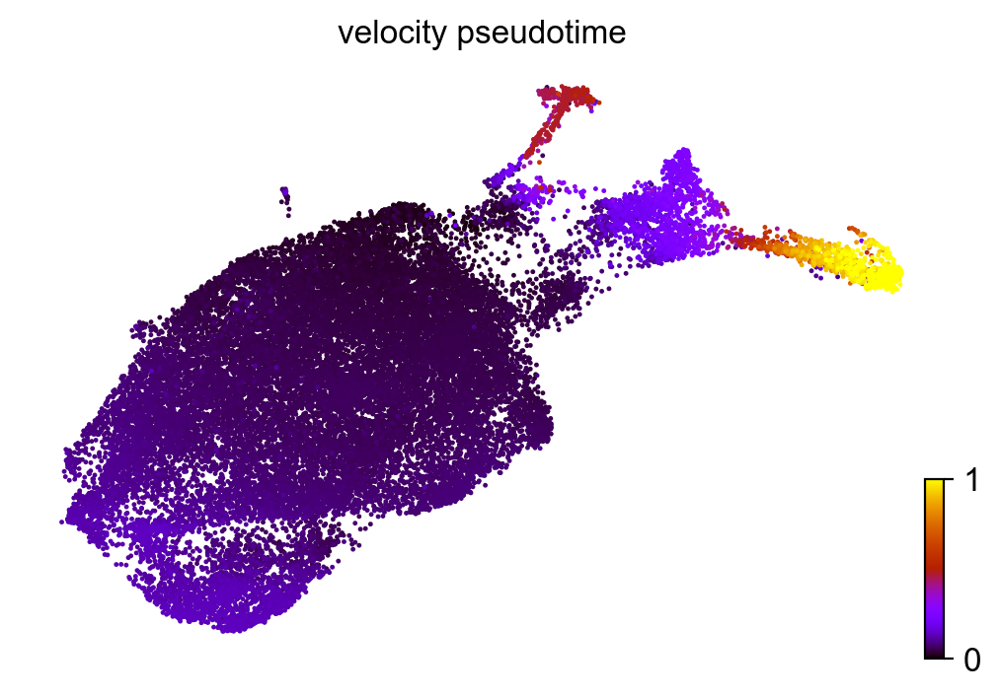

In [39]:
scv.tl.velocity_pseudotime(sceMerge)
scv.pl.scatter(sceMerge, color='velocity_pseudotime', cmap='gnuplot')

## Run PAGA and Plot

In [40]:
# this is needed due to a current bug - bugfix is coming soon.
sceMerge.uns['neighbors']['distances'] = sceMerge.obsp['distances']
sceMerge.uns['neighbors']['connectivities'] = sceMerge.obsp['connectivities']

scv.tl.paga(sceMerge, groups='integrated_snn_res.0.3')
df = scv.get_df(sceMerge, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:08) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,1,2,3,4,5,6,7,8,9,10
1,0,0.29,0.33,0,0,0,0,0,0,0
2,0,0,0,0.22,0.19,0,0,0,0,0
3,0,0,0,0,0,0.097,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0.029
8,0,0,0,0,0,0,0,0,0,0
9,0.15,0,0,0,0,0,0.054,0,0,0
10,0,0,0,0,0,0,0,0.059,0,0


saving figure to file /Users/Oliver.Eichmueller/velocyto_test/plots_MCells/PAGA_all_03.pdf


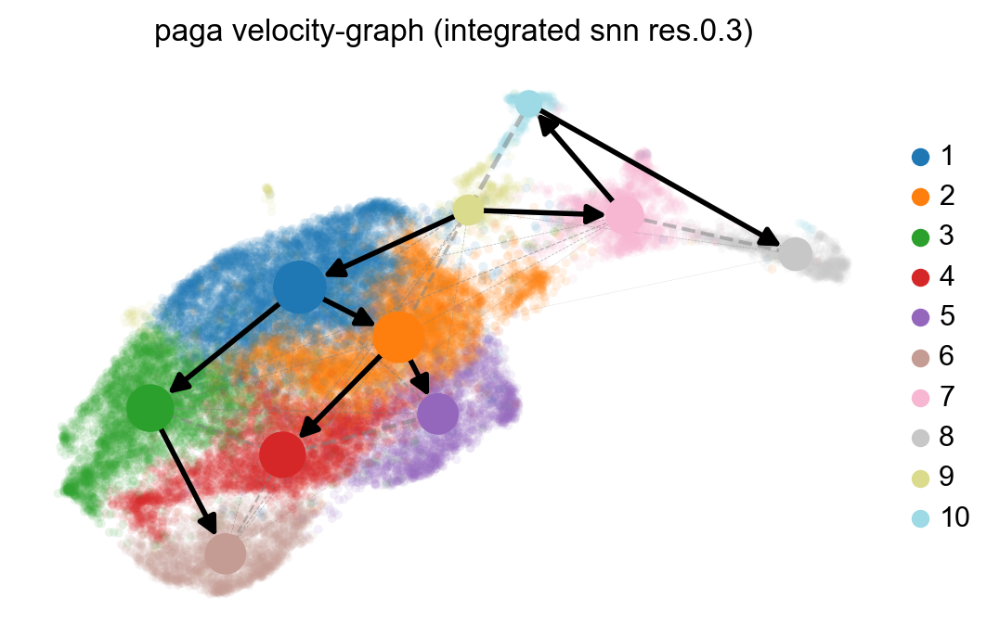

In [41]:
scv.pl.paga(sceMerge, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, 
            save='/Users/Oliver.Eichmueller/velocyto_test/plots_MCells/PAGA_all_03.pdf')

In [42]:
sceMerge.write_h5ad("/Users/Oliver.Eichmueller/velocyto_test/Mcells_211029_filtered.h5ad")